In [1]:
%matplotlib inline

import torch
import requests
from PIL import Image
from io import BytesIO
from matplotlib import pyplot as plt
from torchvision.utils import save_image, make_grid

import torch
from diffusers import StableDiffusionPipeline, UNet2DConditionModel

from diffusers import (
    DiffusionPipeline,
    StableDiffusionImg2ImgPipeline,
    StableDiffusionInpaintPipeline,
    StableDiffusionDepth2ImgPipeline
    )

import torch._dynamo
torch._dynamo.config.suppress_errors = True

/usr/lib/python3/dist-packages/requests/__init__.py:87: RequestsDependencyWarning: urllib3 (2.2.1) or chardet (4.0.0) doesn't match a supported version!
  warnings.warn("urllib3 ({}) or chardet ({}) doesn't match a supported "


In [8]:
from huggingface_hub import notebook_login

notebook_login()


In [9]:
device = ("cuda" if torch.cuda.is_available() else "cpu")
print(device)

In [10]:
model_path = "/home/ubuntu/diffusers/0_fashion_sd_1_4_2"
unet = UNet2DConditionModel.from_pretrained(model_path + "/checkpoint-15000/unet", torch_dtype=torch.float16)

pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", unet=unet, torch_dtype=torch.float16, use_safetensors=True, variant="fp16")
pipe.to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

StableDiffusionPipeline {
  "_class_name": "StableDiffusionPipeline",
  "_diffusers_version": "0.28.0.dev0",
  "_name_or_path": "CompVis/stable-diffusion-v1-4",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": true,
  "safety_checker": [
    "stable_diffusion",
    "StableDiffusionSafetyChecker"
  ],
  "scheduler": [
    "diffusers",
    "PNDMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

  0%|          | 0/45 [00:00<?, ?it/s]

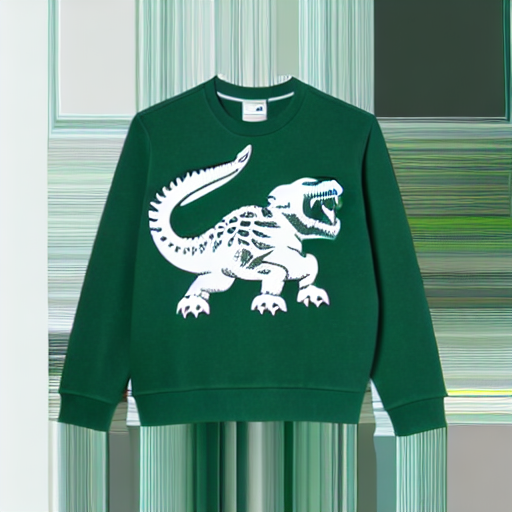

In [11]:
generator = torch.Generator(device=device).manual_seed(42)

# Запускаем pipeline генерации изображения по тексту
pipe_output = pipe(
    prompt= "top, Lacoste Print Sweatshirt green, a photography of a green sweatshirt with dinosaur on it",
    negative_prompt="blurry, low quality, frames", # Что не генерим
    height=512, width=512,     # Размеры выходного изображения
    guidance_scale=7.5,          # Уровень точности генерации
    num_inference_steps=45,    # Количество шагов для генерации
    generator=generator        # Воспроизводимость
)

# Результат
pipe_output.images[0]

In [96]:
from torchvision import transforms as T

# Configuration
model_path = "/home/ubuntu/diffusers/0_fashion_sd_1_4_2"
ini_model_path = "CompVis/stable-diffusion-v1-4"
checkpoints = [ini_model_path, 1000, 3000, 5000, 6000, 7000, 9000, 10000, 12000, 13000, 14000, 15000]
prompt = "top, Lacoste Print Sweatshirt green, a photography of a green sweatshirt with dinosaur on it"
negative_prompt = "Oversaturated, blurry, low quality"
height = 512
width = 512
guidance_scale = 7.5
num_inference_steps = 45
device = "cuda"

# Seed generator
generator = torch.manual_seed(42)

# Transform to convert PIL image to tensor
pil_to_tensor = T.ToTensor()

# Store generated images
images_ft = []
labels_ft  = []

for i, checkpoint in enumerate(checkpoints):
            # Load UNet from checkpoint
    if i == 0:
        # Load Stable Diffusion pipeline with the specific UNet
        pipe = StableDiffusionPipeline.from_pretrained(
        "CompVis/stable-diffusion-v1-4",
        torch_dtype=torch.float16,
        ).to(device)

    else:
        unet = UNet2DConditionModel.from_pretrained(f"{model_path}/checkpoint-{checkpoint}/unet", torch_dtype=torch.float16)

        # Load Stable Diffusion pipeline with the specific UNet
        pipe = StableDiffusionPipeline.from_pretrained(
            "CompVis/stable-diffusion-v1-4",
            unet=unet,
            torch_dtype=torch.float16,
            use_safetensors=True, variant="fp16"
        ).to(device)

    # Generate image
    pipe_output = pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        height=height,
        width=width,
        guidance_scale=guidance_scale,
        num_inference_steps=num_inference_steps,
        generator=generator
    )
    
    # Collect the generated image
    images_ft.append(pipe_output.images[0])
    labels_ft.append(f"Checkpoint-{checkpoint}" if i != 0 else "Initial Model")



Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

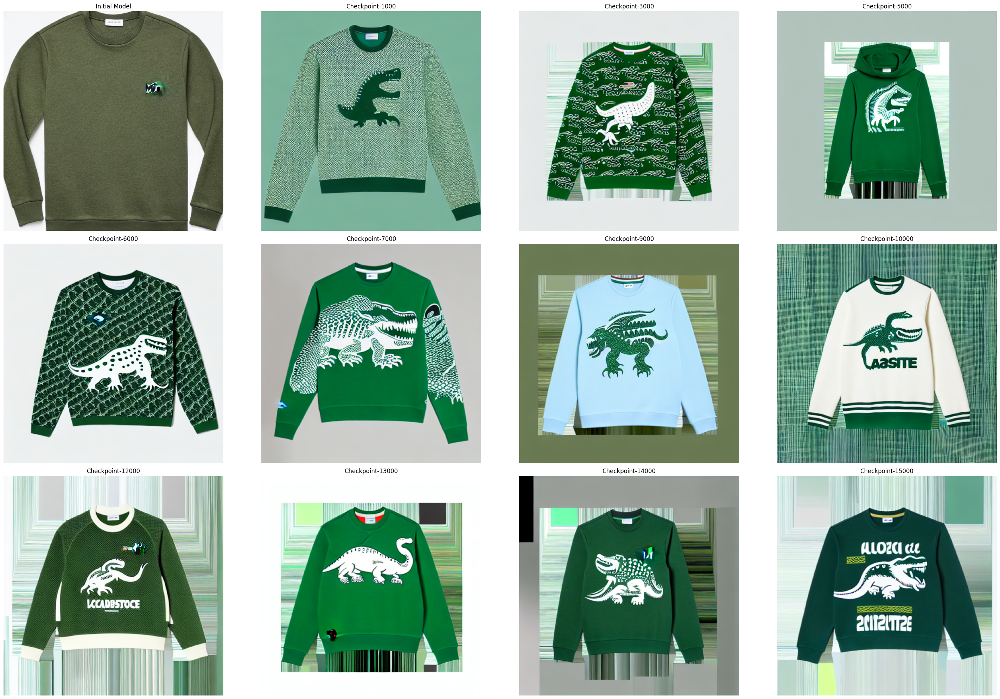

In [97]:
# Plot the images with labels
fig, axes = plt.subplots(nrows=(len(images_ft) + 2) // 4, ncols=4, figsize=(30, 20))

for ax, image, label in zip(axes.flatten(), images_ft, labels_ft):
    ax.imshow(image)
    ax.set_title(label, fontsize=12)
    ax.axis('off')

# Adjust layout and show the plot
plt.tight_layout()

plt.savefig("images_ft_sd-1-4.png")

plt.show()

## LORA

In [ ]:
from torchvision import transforms as T

model_path = "/home/ubuntu/diffusers/sd-kream-model-lora/"
# Configuration
checkpoints = list(range(1000, 16000, 1000))
checkpoints.insert(0, "CompVis/stable-diffusion-v1-4")
prompt = "top, Lacoste Print Sweatshirt green, a photography of a green sweatshirt with dinosaur on it"
negative_prompt = "Oversaturated, blurry, low quality"
height = 512
width = 512
guidance_scale = 7.5
num_inference_steps = 45
device = "cuda"

# Seed generator
generator = torch.manual_seed(42)

# Transform to convert PIL image to tensor
pil_to_tensor = T.ToTensor()

# Store generated images
images_ft = []
labels_ft  = []

for i, checkpoint in enumerate(checkpoints):
    if i == 0:
        pipe = StableDiffusionPipeline.from_pretrained(
        "CompVis/stable-diffusion-v1-4",
        torch_dtype=torch.float16,
        ).to(device)
    else:
        model_path = f"/home/ubuntu/diffusers/sd-kream-model-lora/checkpoint-{checkpoint}"
        pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", torch_dtype=torch.float16)
        pipe.unet.load_attn_procs(model_path)
        pipe.to("cuda")

    # Generate image
    pipe_output = pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        height=height,
        width=width,
        guidance_scale=guidance_scale,
        num_inference_steps=num_inference_steps,
        generator=generator
    )
    
    # Collect the generated image
    images_ft.append(pipe_output.images[0])
    labels_ft.append(f"Checkpoint-{checkpoint}" if i != 0 else "Initial Model")

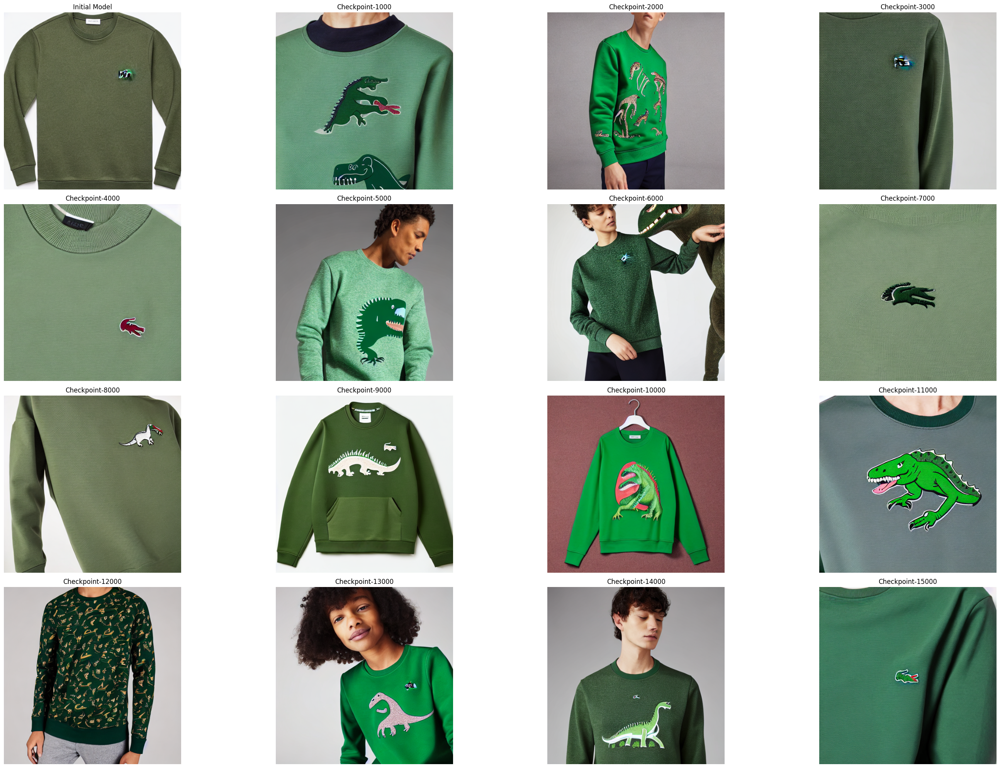

In [29]:
# Plot the images with labels
fig, axes = plt.subplots(nrows=(len(images_ft) + 2) // 4, ncols=4, figsize=(30, 20))

for ax, image, label in zip(axes.flatten(), images_ft, labels_ft):
    ax.imshow(image)
    ax.set_title(label, fontsize=12)
    ax.axis('off')

# Adjust layout and show the plot
plt.tight_layout()

plt.savefig("images_lora_sd-1-4.png")

plt.show()